<a href="https://colab.research.google.com/github/GokulKrishna2001/Computer-Vision-Lab/blob/main/ComputerVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Contrast Stretching

Text(0.5, 1.0, 'Contrast Stretched Image')

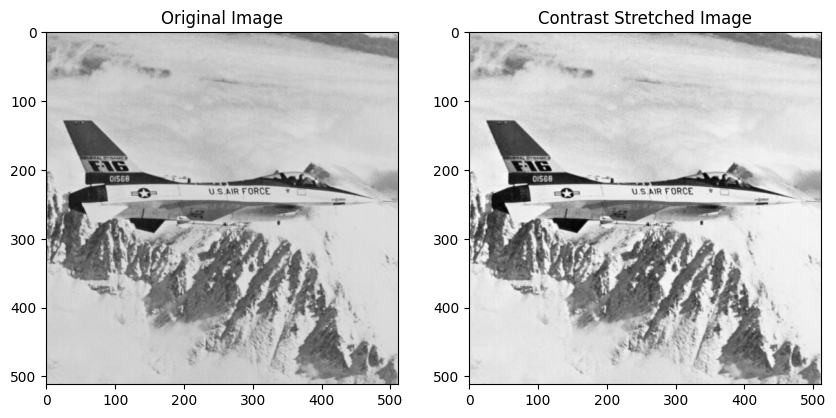

In [ ]:
#contrast stretching

import cv2
from matplotlib import pyplot as plt

#dclaring the plot
fig=plt.figure(figsize=(10,5))

#input the image
img1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/jetplane.tif')
image1=cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)

#doing contrast stretching with the equation:
#g=((f-f.min())/(f.max()-f.min()))
image2=((image1-image1.min())/(image1.max()-image1.min()))

#adding subplots
fig.add_subplot(121)
plt.imshow(image1)
plt.title("Original Image")

fig.add_subplot(122)
plt.imshow(image2)
plt.title("Contrast Stretched Image")

In [ ]:
#calculating the peak signal to noise ratio
#Higher PSNR values indicate that the images are more similar

import numpy as np

#getting the sifference between the 2 images
difference=np.subtract(image1,image2)
squared_difference=np.square(difference)

#mean squared error
mean_squared_error=np.mean(squared_difference)

#computing the PSNR
#PSNR= 10 * log10(max^2 / MSE)
#PSNR=20 * log10(max/Root MSE)
max=255 #maximum pixel
peak_signal_to_noise_ratio= 10 * np.log10(max**2 / mean_squared_error)
print("Peak Signal To Noise Ratio:",peak_signal_to_noise_ratio)

Peak Signal To Noise Ratio: 2.875063199338956


## Linear Filtering

Text(0.5, 1.0, 'Median Filter for 50% S&P Noise')

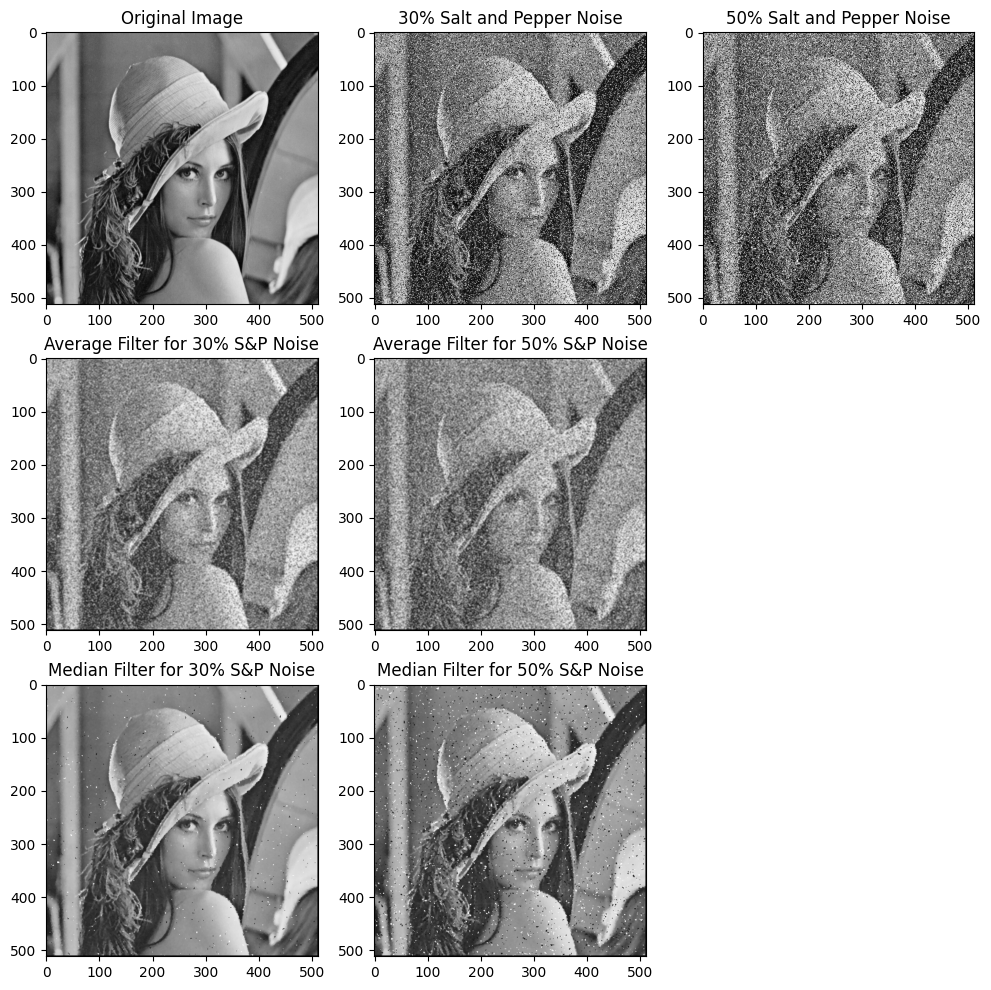

In [ ]:
#linear filtering
#apply salt and pepper noise of the certain percentage and apply a linear filter to it

import cv2
import numpy as np
from matplotlib import pyplot as plt

fig=plt.figure(figsize=(12,12))

image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/lena_color_512.tif')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)
image1=cv2.cvtColor(image1,cv2.COLOR_RGB2GRAY)

#adding salt and pepper noise
def salt_and_pepper_noise(image, percentage):
  size=image.size
  #setting the noise size, with percentage * size
  noise_size=int(percentage * size)
  #selecting indices for adding noise
  random_indices=np.random.choice(size,noise_size)
  noisy_image=image.copy()
  noise=np.random.choice([image.min(),image.max()], noise_size)
  noisy_image.flat[random_indices]=noise
  return noisy_image

#adding averaging filter
def averaging_filter(image1):
  mask=np.ones((7,7),dtype=int)#mask
  mask=mask/9
  image_avg=np.ones((image1.shape[0],image1.shape[1]))
  for i in range(1,image1.shape[0]-1):
    for j in range(1,image1.shape[1]-1):
      temp = (image1[i-1, j-1]*mask[0, 0]+
              image1[i-1, j]*mask[0, 1]+
              image1[i-1, j + 1]*mask[0, 2]+
              image1[i, j-1]*mask[1, 0]+
              image1[i, j]*mask[1, 1]+
              image1[i, j + 1]*mask[1, 2]+
              image1[i + 1, j-1]*mask[2, 0]+
              image1[i + 1, j]*mask[2, 1]+
              image1[i + 1, j + 1]*mask[2, 2])
      image_avg[i,j]=temp
  image_avg=image_avg.astype(np.uint8)
  return image_avg

#adding median filter
def median_filter(image1):
  m,n=image1.shape
  median=np.zeros([m,n])

  for i in range(1,m-1):
    for j in range(1,n-1):
      temp=[image1[i-1,j-1],
            image1[i-1,j],
            image1[i-1,j+1],
            image1[i,j-1],
            image1[i,j],
            image1[i,j+1],
            image1[i+1,j-1],
            image1[i+1,j],
            image1[i+1,j+1]]
      temp=sorted(temp)
      median[i,j]=temp[4]
  median=median.astype(np.uint8)
  return median


#30%,50% salt and pepper noise
noisy_image1=salt_and_pepper_noise(image1,0.3)
noisy_image2=salt_and_pepper_noise(image1,0.5)
#adding averaging filter
image_avg1=averaging_filter(noisy_image1)
image_avg2=averaging_filter(noisy_image2)
#adding median filter
median1=median_filter(noisy_image1)
median2=median_filter(noisy_image2)

#adding subplots
fig.add_subplot(331)
plt.imshow(image1,cmap="gray")
plt.title("Original Image")

fig.add_subplot(332)
plt.imshow(noisy_image1,cmap="gray")
plt.title("30% Salt and Pepper Noise")

fig.add_subplot(333)
plt.imshow(noisy_image2,cmap="gray")
plt.title("50% Salt and Pepper Noise")

fig.add_subplot(334)
plt.imshow(image_avg1,cmap="gray")
plt.title("Average Filter for 30% S&P Noise")

fig.add_subplot(335)
plt.imshow(image_avg2,cmap="gray")
plt.title("Average Filter for 50% S&P Noise")

fig.add_subplot(337)
plt.imshow(median1,cmap="gray")
plt.title("Median Filter for 30% S&P Noise")

fig.add_subplot(338)
plt.imshow(median2,cmap="gray")
plt.title("Median Filter for 50% S&P Noise")

In [ ]:
import numpy as np

def psnr(image1,image2):
  #getting the sifference between the 2 images
  difference=np.subtract(image1,image2)
  squared_difference=np.square(difference)

  #mean squared error
  mean_squared_error=np.mean(squared_difference)
  max=255 #maximum pixel
  peak_signal_to_noise_ratio= 10 * np.log10(max**2 / mean_squared_error)
  print("Peak Signal To Noise Ratio:",peak_signal_to_noise_ratio)

print("PSNR for 30% Noisy Image after Median FIlter:")
psnr(image1,median1)
print("PSNR for 50% Noisy Image after Median FIlter:")
psnr(image1,median2)

PSNR for 30% Noisy Image after Median FIlter:
Peak Signal To Noise Ratio: 35.08084162925401
PSNR for 50% Noisy Image after Median FIlter:
Peak Signal To Noise Ratio: 33.92002793368291


## Canny Edge Detection

Weak Threshold of the Image: 13.91186543925724
Strong Threshold of the Image: 41.735596317771716


Text(0.5, 1.0, 'Image with Contours')

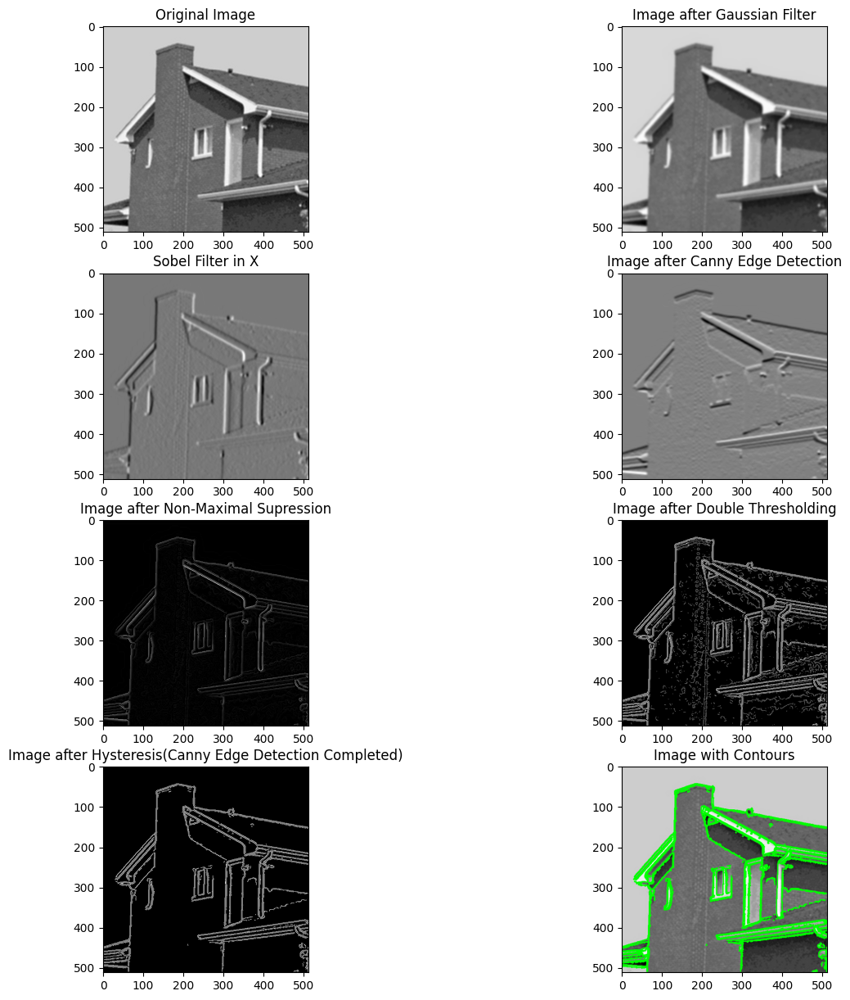

In [ ]:
#canny edge detection
#with contours also plotted
#steps
#1) Gaussian Kernal
#2) Sobel Filters
#3) Non Max Supression
#4) Threshold
#5) hysteresis
import cv2
import numpy as np
from matplotlib import pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy import ndimage

fig=plt.figure(figsize=(15,15))

image_original=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/house.tif')
image1=cv2.cvtColor(image_original,cv2.COLOR_BGR2RGB)
image1=cv2.cvtColor(image1,cv2.COLOR_RGB2GRAY)

#applying gaussian filter
image_gaussian=gaussian_filter(image1,sigma=2)

#applying sobel filter
#sobel kernels in x and y
Ix=cv2.Sobel(np.float32(image_gaussian),cv2.CV_64F,1,0,3)#1 for x direction with kernel size=3x3
Iy=cv2.Sobel(np.float32(image_gaussian),cv2.CV_64F,0,1,3)#0 for y direction with kernel size=3x3
#getting the polar coordinates from the cartesian coordinates
magnitude,angle=cv2.cartToPolar(Ix,Iy,angleInDegrees=True)

#finding the maxmimum magnitude
max_magnitude=np.max(magnitude)
#setting the minimum and maximum thresholds
weak_threshold=None
strong_threshold=None
if not weak_threshold:weak_threshold=max_magnitude*0.05
if not strong_threshold:strong_threshold=max_magnitude*0.15
print("Weak Threshold of the Image:",weak_threshold)
print("Strong Threshold of the Image:",strong_threshold)

#non maxmimal suppression
for i in range(0,image1.shape[0]):
  for j in range(0,image1.shape[1]):
    grad_angle=angle[j,i]
    grad_angle=abs(grad_angle-180) if abs(grad_angle)>180 else abs(grad_angle)#keeping the angles between the range 0-180

    #finding out the neighbors according to the current pixel based on the gradient angle

    if grad_angle<=22.5:
      neighbor1_x,neighbor1_y=i-1,j
      neighbor2_x,neighbor2_y=i+1,j
    elif (22.5<grad_angle<=67.5):
      neighbor1_x,neighbor1_y=i-1,j-1
      neighbor2_x,neighbor2_y=i+1,j+1
    elif (67.5<grad_angle<=112.5):
      neighbor1_x,neighbor1_y=i,j-1
      neighbor2_x,neighbor2_y=i,j+1
    elif (112.5<grad_angle<=157.5):
      neighbor1_x,neighbor1_y=i-1,j+1
      neighbor2_x,neighbor2_y=i+1,j-1
    elif (157.5<grad_angle<=202.5):
      neighbor1_x,neighbor1_y=i-1,j
      neighbor2_x,neighbor2_y=i+1,j

    #Non maximum suppression
    #changing the magnitude to 0 if any of the values are lesser
    if image1.shape[0]>neighbor1_x>=0 and image1.shape[1]>neighbor1_y>=0:
      if magnitude[j,i]<magnitude[neighbor1_y,neighbor1_x]:
        magnitude[j,i]=0

    if image1.shape[0]>neighbor2_x>=0 and image1.shape[1]>neighbor2_y>=0:
      if magnitude[j,i]<magnitude[neighbor2_y,neighbor2_x]:
        magnitude[j,i]=0

#for weak and strong ids
weak_ids=np.zeros_like(image1)
strong_ids=np.zeros_like(image1)
ids=np.zeros_like(image1)
final_img=np.zeros_like(image1)

#for double thresholding
for i in range(0,image1.shape[0]):
  for j in range(0,image1.shape[1]):
    gradient_magnitude=magnitude[j,i]
    if gradient_magnitude<weak_threshold:
      ids[j,i]=0 #for 0 value
    elif weak_threshold<=gradient_magnitude<=strong_threshold:
      ids[j,i]=1 #for weak pixel
    else:
      ids[j,i]=2 #for strong pixel

#for hysteresis
for i in range(0,image1.shape[0]-1):
  for j in range(0,image1.shape[1]-1):
    #for weak pixel
    if ids[j,i]==1:
      if((ids[j+1,i]==2) or (ids[j+1,i+1]==2) or (ids[j+1,i-1]==2) or (ids[j,i+1]==2) or (ids[j,i-1]==2) or (ids[j-1,i+1]==2) or (ids[j-1,i-1]==2) or (ids[j-1,i]==2)):
        final_img[j,i]=strong_threshold
      else:
        final_img[j,i]=0
    elif ids[j,i]==2:
      #for strong pixels
      final_img[j,i]=strong_threshold

fig.add_subplot(421)
plt.imshow(image1,cmap="gray")
plt.title("Original Image")

fig.add_subplot(422)
plt.imshow(image_gaussian,cmap="gray")
plt.title("Image after Gaussian Filter")

fig.add_subplot(423)
plt.imshow(Ix,cmap="gray")
plt.title("Sobel Filter in X")

fig.add_subplot(424)
plt.imshow(Iy,cmap="gray")
plt.title("Image after Canny Edge Detection")

fig.add_subplot(425)
plt.imshow(magnitude,cmap="gray")
plt.title("Image after Non-Maximal Supression")

fig.add_subplot(426)
plt.imshow(ids,cmap="gray")
plt.title("Image after Double Thresholding")

fig.add_subplot(427)
plt.imshow(final_img,cmap="gray")
plt.title("Image after Hysteresis(Canny Edge Detection Completed)")


#to find the contours
contours,_=cv2.findContours(final_img,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
image2=cv2.drawContours(image_original,contours,-1,(0,255,0),2)#-1 is for finding the contours


fig.add_subplot(428)
plt.imshow(image2,cmap="gray")
plt.title("Image with Contours")

## Finding the Contours of an Image

Text(0.5, 1.0, 'Image with Contours')

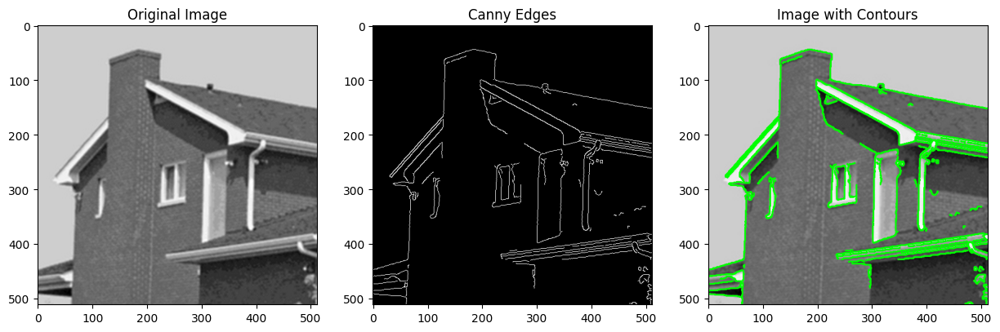

In [ ]:
#finding the contours of an image
import cv2
import numpy as np
from matplotlib import pyplot as plt

fig=plt.figure(figsize=(15,15))

image_original=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/house.tif')
image1=cv2.cvtColor(image_original,cv2.COLOR_BGR2RGB)
image1=cv2.cvtColor(image1,cv2.COLOR_RGB2GRAY)

fig.add_subplot(131)
plt.imshow(image1,cmap="gray")
plt.title("Original Image")
#finding the canny edges using cv2 function
canny_edges=cv2.Canny(image1,100,150)#lower and upper thresholds


fig.add_subplot(132)
plt.imshow(canny_edges,cmap="gray")
plt.title("Canny Edges")

#finding the contours using the canny edges
#cv2.RETR_EXTERNAL=only finds the external contours
#cv2.CHAIN_APPROX_NONE=to store all the contour points
contours,_=cv2.findContours(canny_edges,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

#drawing the contours
image2=cv2.drawContours(image_original,contours,-1,(0,255,0),2)#-1 is for finding the contours


fig.add_subplot(133)
plt.imshow(image2,cmap="gray")
plt.title("Image with Contours")

## Morphological Operations on an Image with different Structuring Elements

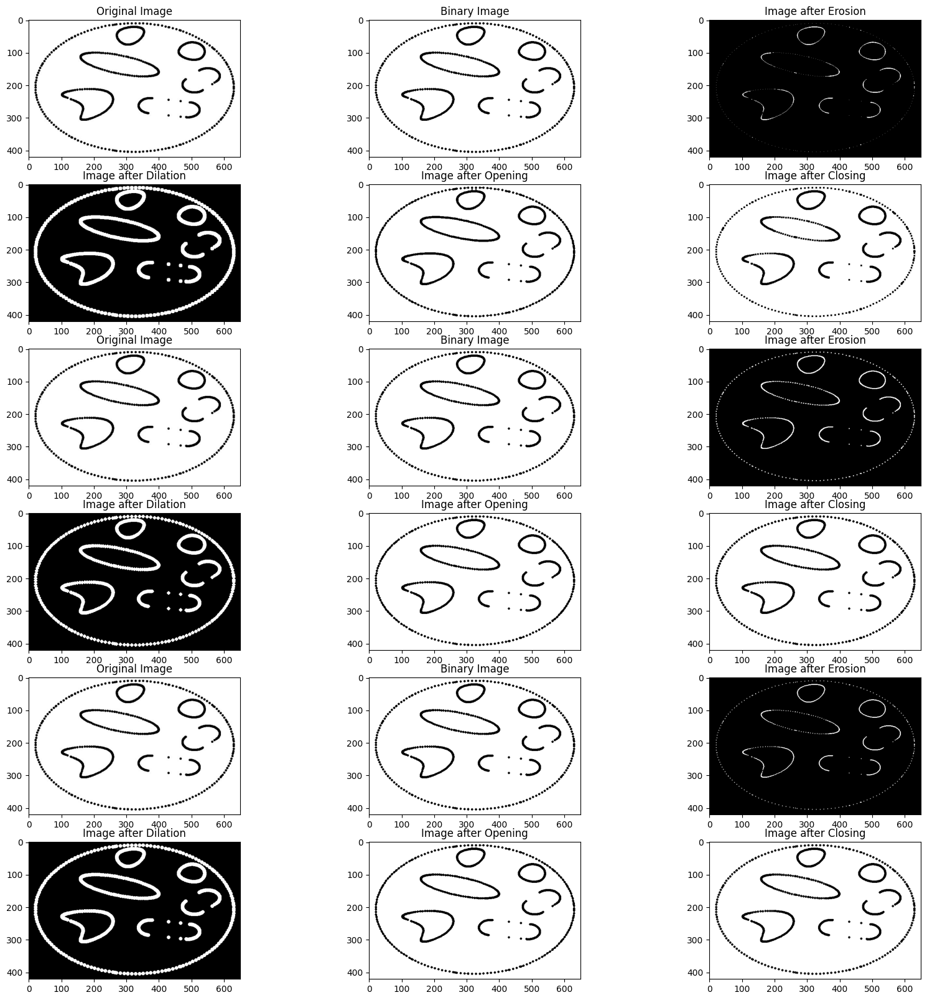

In [ ]:
#morphological operations: erosion, dilation, opening, closing

import cv2
import numpy as np
from matplotlib import pyplot as plt
fig=plt.figure(figsize=(20,20))

image=cv2.imread("/content/drive/MyDrive/Colab Notebooks/Standard Images/holes.jpg")
def morph_ops(kernel,i):
    img1=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    img2=cv2.cvtColor(image,cv2.COLOR_RGB2GRAY)

    #erosion
    #to erode the outer surface/foreground of the image

    _,binary_img=cv2.threshold(img2,50,255,cv2.THRESH_BINARY)

    #invert the binary image
    invert_bin_img=cv2.bitwise_not(binary_img)

    erosion=cv2.erode(invert_bin_img,kernel,iterations=1)
    erosion=cv2.cvtColor(erosion,cv2.COLOR_BGR2RGB)

    #dilation
    #dilates the foreground of the image
    #expands the foreground of the image and make it white
    dilation=cv2.dilate(invert_bin_img,kernel,iterations=1)
    dilation=cv2.cvtColor(dilation,cv2.COLOR_BGR2RGB)

    #opening
    #involves erosion followed by dilation in the foreground of the image
    opening=cv2.morphologyEx(binary_img,cv2.MORPH_OPEN,kernel,iterations=1)
    opening=cv2.cvtColor(opening,cv2.COLOR_BGR2RGB)

    #closing
    #involves dilation followed by erosion in the outer surface of the image
    closing=cv2.morphologyEx(binary_img,cv2.MORPH_CLOSE,kernel,iterations=1)
    closing=cv2.cvtColor(closing,cv2.COLOR_BGR2RGB)

    fig.add_subplot(6,3,i)
    plt.imshow(img1)
    plt.title('Original Image')
    i=i+1
    fig.add_subplot(6,3,i)
    plt.imshow(binary_img,cmap="gray")
    plt.title('Binary Image')
    i=i+1
    fig.add_subplot(6,3,i)
    plt.imshow(erosion)
    plt.title("Image after Erosion")
    i=i+1
    fig.add_subplot(6,3,i)
    plt.imshow(dilation)
    plt.title("Image after Dilation")
    i=i+1
    fig.add_subplot(6,3,i)
    plt.imshow(opening)
    plt.title("Image after Opening")
    i=i+1
    fig.add_subplot(6,3,i)
    plt.imshow(closing)
    plt.title("Image after Closing")
    i=i+1

    return i

i=int(1)
#using 5x5 box structuring element
kernel=np.ones((5,5),np.uint8)
i=morph_ops(kernel,i)

#using a 5x5 circle structuring element
kernel=np.array([
    [0,0,1,0,0],
    [0,1,1,1,0],
    [1,1,1,1,1],
    [0,1,1,1,0],
    [0,0,1,0,0]
    ],dtype=np.uint8)
i=morph_ops(kernel,i)

#using a 5x5 ring structuring element
kernel=np.array([
    [0,1,1,1,0],
    [1,0,0,0,1],
    [1,0,0,0,1],
    [1,0,0,0,1],
    [0,1,1,1,0]
    ],dtype=np.uint8)
i=morph_ops(kernel,i)


## Extract the cells from a Microscopic Image and find the Region Properties of each Cell

Text(0.5, 1.0, 'Original hi')

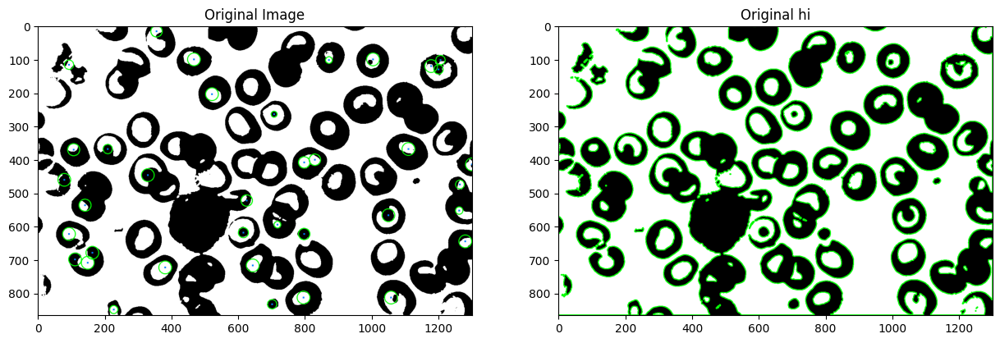

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

fig=plt.figure(figsize=(15,10))

#input the microscopic image
image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/rbc2.jpg')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
#(threshold, image1)=cv2.threshold(image1,150,255,cv2.THRESH_BINARY)

#apply gaussian blur
image2=cv2.GaussianBlur(image1,(5,5),0)

#applying otsu's thersholding
#INV is used for better dilation results
(_,image3)=cv2.threshold(image2,100,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

#performing dilation followed by closing to highlight the cells
kernel=np.array([
    [1,1,1],
    [1,1,1],
    [1,1,1]
    ],dtype=np.uint8)
image4=cv2.dilate(image3,kernel,iterations=1)
#image4=cv2.morphologyEx(image4,cv2.MORPH_CLOSE,kernel)
#image4=cv2.GaussianBlur(image4,(5,5),0)
#(_,image4)=cv2.threshold(image4,100,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

#detecting the number of cells or contours in this
image5=cv2.cvtColor(image4,cv2.COLOR_GRAY2BGR)
#finding the contours using the function findContours
#RETR_LIST returns all the contours in the exterior and interior of the image
contours,_=cv2.findContours(image4,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
#drawing the contours
image_contours=cv2.drawContours(image5.copy(),contours,-1,(0,255,0),2)
#finding the number of cells:
#cells=len(contours)
#print("The number of cells:",cells)

#using Hough Transform
#1.2 for faster circle detection
#20 is the minimum distance between the centers of the circle
#param1 is the higher threshold of the canny edge detector
#param2 is the threshold considered by the accumulator to be a valid circle
circles=cv2.HoughCircles(image4, cv2.HOUGH_GRADIENT, 2, 20, param1=50, param2=28, minRadius=1,maxRadius=20)

cells ,x_count,y_count=[],[],[]#x,y coordinate circles
#labeling
if circles is not None:
  #converting the coordinates and radius of the circle to integers
  circles=np.round(circles[0,:]).astype("int")

  for (x,y,r) in circles:
    cv2.circle(image5,(x,y),r,(0,255,0),2)
    cv2.rectangle(image5, (x - 2, y - 2),(x + 2, y + 2), (0, 128, 255), -1)
    cells.append(r)
    x_count.append(x)
    y_count.append(y)

fig.add_subplot(121)
plt.imshow(image5)
plt.title("Original Image")



fig.add_subplot(122)
plt.imshow(image_contours)
plt.title("Original hi")

# LBP Texture Features of an Image

Text(0.5, 1.0, 'Image with the LBP Features')

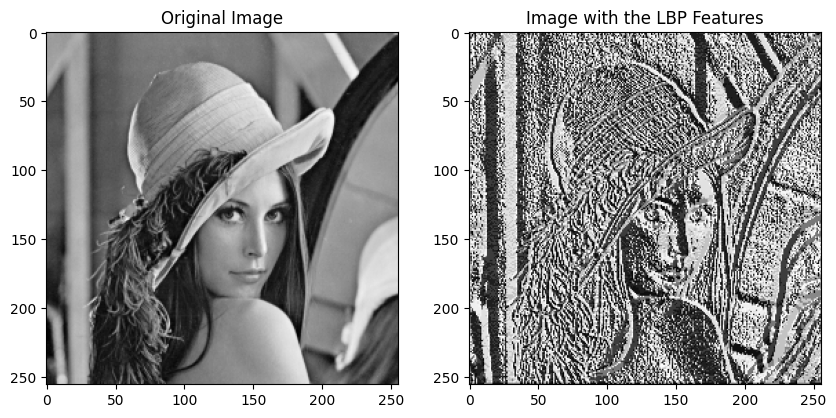

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
fig=plt.figure(figsize=(10,10))

image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/lena_color_256.tif')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)
height,width=image1.shape

def get_pixel(image,center,x,y):
  new_value=0
  try:
    if image[x][y]>=center:
      new_value=1
  except:
    pass
  return new_value

def lbp_calculated_pixel(image,x,y):
  center=image[x][y]
  value=[]

  #going from top left to right to bottom to bottom left and back on top
  value.append(get_pixel(image,center,x-1,y-1))
  value.append(get_pixel(image,center,x-1,y))
  value.append(get_pixel(image,center,x-1,y+1))
  value.append(get_pixel(image,center,x,y+1))
  value.append(get_pixel(image,center,x+1,y+1))
  value.append(get_pixel(image,center,x+1,y))
  value.append(get_pixel(image,center,x+1,y-1))
  value.append(get_pixel(image,center,x,y-1))

  #converting to binary values to decimals
  power_val=[1,2,4,8,16,32,64,128]
  val=0
  for i in range(len(value)):
    val+=value[i]*power_val[i]
  return val


#creating an array for LBP
lbp=np.zeros((height,width),np.uint8)

for i in range(0, height):
    for j in range(0, width):
        lbp[i, j] = lbp_calculated_pixel(image1, i, j)

fig.add_subplot(121)
plt.imshow(image1,cmap='gray')
plt.title("Original Image")

fig.add_subplot(122)
plt.imshow(lbp,cmap='gray')
plt.title("Image with the LBP Features")

# Finding the HOG of an Image
##### (first use 8x8 cell size then change it)

Text(0.5, 1.0, 'HOG Image with 16x16 Cell Size')

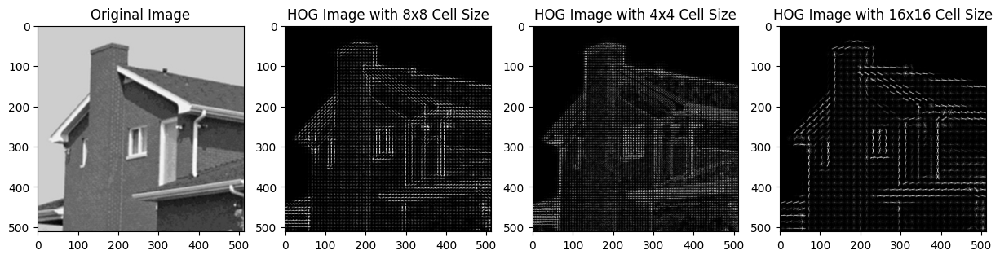

In [ ]:
import cv2
from skimage.feature import hog
from matplotlib import pyplot as plt
from skimage import exposure

fig=plt.figure(figsize=(15,15))

image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/house.tif')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)

#extracting the HOG features
#orientations is the direction of edges
#pixels_per_cells calculate the area of a cell
#cells_per_block takes the area of the cells to normalize the gradient info
#visualize true gives the visual representation
features, hog_image=hog(image1,
                        orientations=9,
                        pixels_per_cell=(8,8),
                        cells_per_block=(2,2),
                        visualize=True)

#exposure.rescale_intensity adjusts the intensity value of the gradients
#0-10 gives a wider range of intensities
hog_image=exposure.rescale_intensity(hog_image,in_range=(0,10))

#using cell size=4x4
features,hog_image2=hog(image1,
                        orientations=9,
                        pixels_per_cell=(4,4),
                        cells_per_block=(2,2),
                        visualize=True)

hog_image2=exposure.rescale_intensity(hog_image2,in_range=(0,10))

#using cell size=16x16
features,hog_image3=hog(image1,
                        orientations=9,
                        pixels_per_cell=(16,16),
                        cells_per_block=(2,2),
                        visualize=True)

hog_image3=exposure.rescale_intensity(hog_image3,in_range=(0,10))

fig.add_subplot(141)
plt.imshow(image1,cmap="gray")
plt.title("Original Image")

fig.add_subplot(142)
plt.imshow(hog_image,cmap="gray")
plt.title("HOG Image with 8x8 Cell Size")

fig.add_subplot(143)
plt.imshow(hog_image2,cmap="gray")
plt.title("HOG Image with 4x4 Cell Size")

fig.add_subplot(144)
plt.imshow(hog_image3,cmap="gray")
plt.title("HOG Image with 16x16 Cell Size")

# Analyzing the Different Colour Transforms

Text(0.5, 1.0, 'Blue Channel')

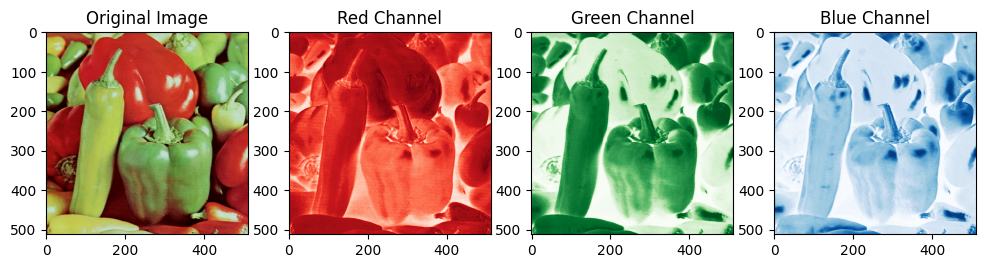

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

#RGB image
image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/peppers_color.tif')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)

fig=plt.figure(figsize=(12,12))
r,g,b=cv2.split(image1)

fig.add_subplot(141)
plt.imshow(image1)
plt.title("Original Image")

fig.add_subplot(142)
plt.imshow(r,cmap="Reds")
plt.title("Red Channel")

fig.add_subplot(143)
plt.imshow(g,cmap="Greens")
plt.title("Green Channel")

fig.add_subplot(144)
plt.imshow(b,cmap="Blues")
plt.title("Blue Channel")

Text(0.5, 1.0, 'Binary Image')

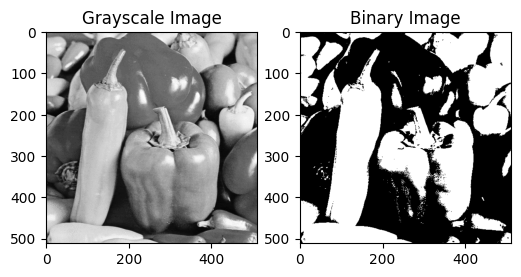

In [ ]:
#to grayscale
fig=plt.figure(figsize=(6,6))
image2=cv2.cvtColor(image1,cv2.COLOR_RGB2GRAY)
fig.add_subplot(121)
plt.imshow(image2,cmap="gray")
plt.title("Grayscale Image")

#to binary
(_,image3)=cv2.threshold(image2,120,255,cv2.THRESH_BINARY)
fig.add_subplot(122)
plt.imshow(image3,cmap="gray")
plt.title("Binary Image")


Text(0.5, 1.0, 'Value')

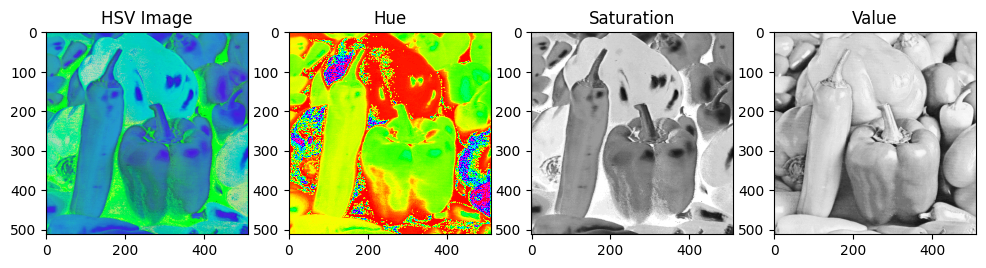

In [ ]:
#RGB to HSV
fig=plt.figure(figsize=(12,12))

image4=cv2.cvtColor(image1,cv2.COLOR_RGB2HSV)
h,s,v=cv2.split(image4)

fig.add_subplot(141)
plt.imshow(image4)
plt.title("HSV Image")

fig.add_subplot(142)
plt.imshow(h,cmap='hsv')
plt.title("Hue")

fig.add_subplot(143)
plt.imshow(s,cmap='gray')
plt.title("Saturation")

fig.add_subplot(144)
plt.imshow(v,cmap='gray')
plt.title("Value")

Text(0.5, 1.0, 'Black')

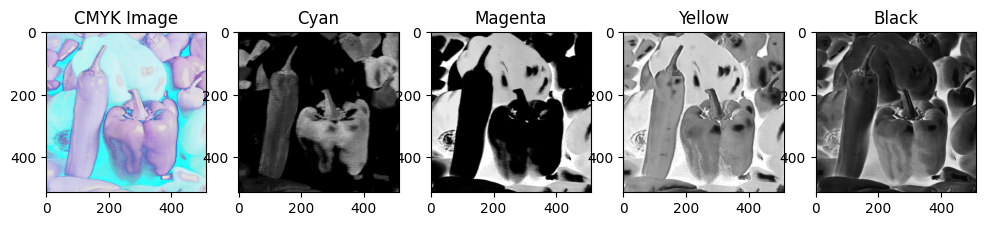

In [ ]:
#RGB to CMYK
fig=plt.figure(figsize=(12,12))
r,g,b=cv2.split(image1)

k_black=1-(np.maximum(np.maximum(r,g),b)/255.0)
cyan=(1-r/255.0-k_black)/(1-k_black+ 1e-5)
magenta=(1-g/255.0-k_black)/(1-k_black+ 1e-5)
yellow=(1-b/255.0-k_black)/(1-k_black+ 1e-5)

image5=cv2.merge((cyan,magenta,yellow,k_black))
fig.add_subplot(151)
plt.imshow(image5)
plt.title("CMYK Image")

fig.add_subplot(152)
plt.imshow(cyan,cmap='gray')
plt.title("Cyan")

fig.add_subplot(153)
plt.imshow(magenta,cmap='gray')
plt.title("Magenta")

fig.add_subplot(154)
plt.imshow(yellow,cmap='gray')
plt.title("Yellow")

fig.add_subplot(155)
plt.imshow(k_black,cmap='gray')
plt.title("Black")


Text(0.5, 1.0, 'Red-Brightness')

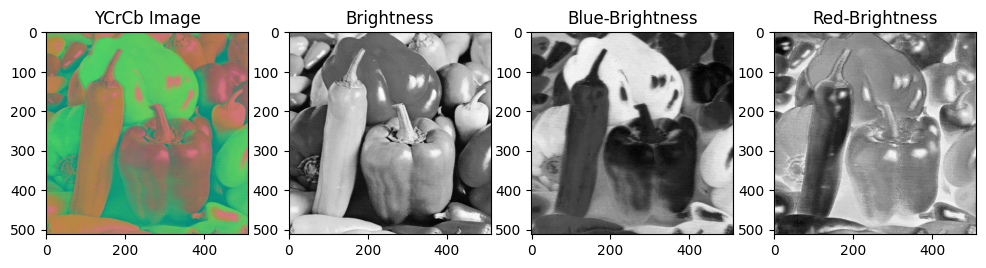

In [ ]:
#RGB to YCrCb
#Y-brightness (luma)
#Cb-blue minus luma (B-Y)
#Cr-red minus luma
image6=cv2.cvtColor(image1,cv2.COLOR_RGB2YCrCb)
y,cr,cb=cv2.split(image6)

fig=plt.figure(figsize=(12,12))

fig.add_subplot(141)
plt.imshow(image6)
plt.title("YCrCb Image")

fig.add_subplot(142)
plt.imshow(y,cmap='gray')
plt.title("Brightness")

fig.add_subplot(143)
plt.imshow(cr,cmap='gray')
plt.title("Blue-Brightness")

fig.add_subplot(144)
plt.imshow(cb,cmap='gray')
plt.title("Red-Brightness")


Text(0.5, 1.0, 'Blue-Yellow Axis')

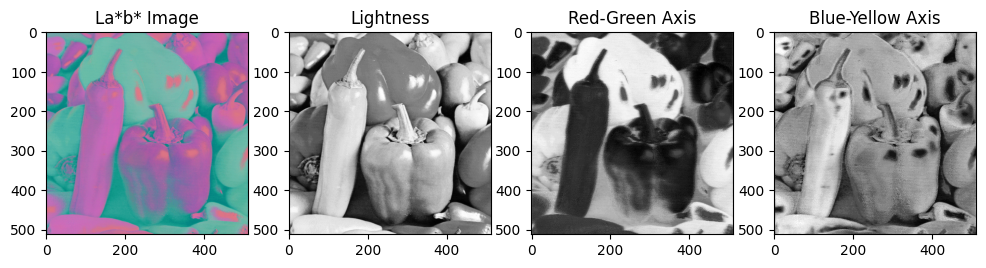

In [ ]:
#RGB to La*b*
#L-Lightness
#a*-represents the red-green axis
#b*-represents the blue-yellow axis
fig=plt.figure(figsize=(12,12))
image7=cv2.cvtColor(image1,cv2.COLOR_RGB2Lab)
l,a,b=cv2.split(image7)

fig.add_subplot(141)
plt.imshow(image7)
plt.title("La*b* Image")

fig.add_subplot(142)
plt.imshow(l,cmap='gray')
plt.title("Lightness")

fig.add_subplot(143)
plt.imshow(a,cmap='gray')
plt.title("Red-Green Axis")

fig.add_subplot(144)
plt.imshow(b,cmap='gray')
plt.title("Blue-Yellow Axis")

Text(0.5, 1.0, 'Lightness')

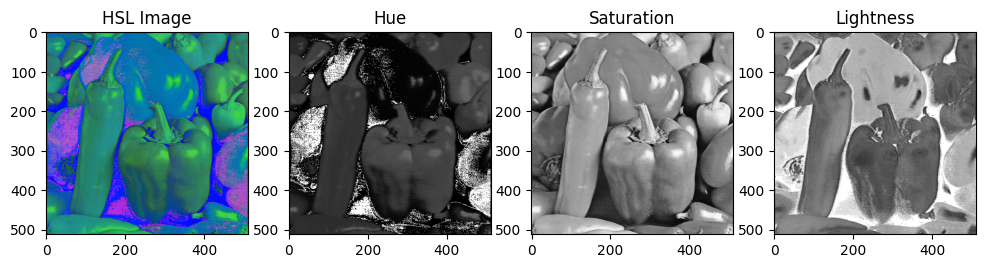

In [ ]:
#RGB to HSL: Hue, Saturation, Lightness
fig=plt.figure(figsize=(12,12))

image8=cv2.cvtColor(image1,cv2.COLOR_RGB2HLS)
h,s,l=cv2.split(image8)

fig.add_subplot(141)
plt.imshow(image8)
plt.title("HSL Image")

fig.add_subplot(142)
plt.imshow(h,cmap='gray')
plt.title("Hue")

fig.add_subplot(143)
plt.imshow(s,cmap='gray')
plt.title("Saturation")

fig.add_subplot(144)
plt.imshow(l,cmap='gray')
plt.title("Lightness")

# Convert an Image to its HSI.
##### Increase S by 40%
##### Decrease S by 30%

<ipython-input-20-101595a29b1f>:27: RuntimeWarning: invalid value encountered in sqrt
  den = (np.sqrt((r-g)**2+(r-g)*(g-b)+1e-5))


Text(0.5, 1.0, 'HSI Image')

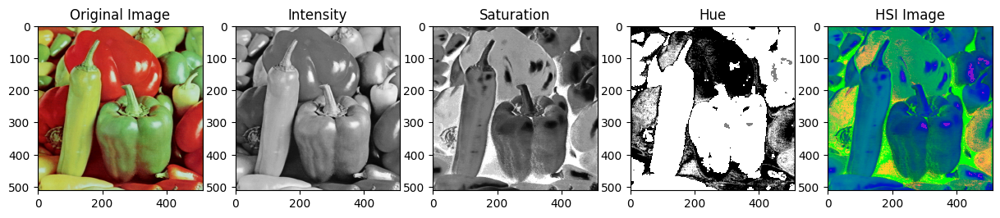

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

fig=plt.figure(figsize=(15,15))
image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/peppers_color.tif')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)


r,g,b=cv2.split(image1)
r=r.astype(np.float32)
g=g.astype(np.float32)
b=b.astype(np.float32)

#intensity
intensity=(r+g+b)/3
intensity=intensity/255.0

#saturation
saturation=1-(3 * (np.minimum(np.minimum(r,g),b))/(r+g+b+1e-5))
#saturation=1-3*((np.minimum(np.minimum(r,g),b))//(r+g+b+1e-5))
#saturation=saturation/255.0

#hue
#theta=np.arccos((0.5*((r-g)+(r-b)))//(np.sqrt((r-g)**2+(r-g)*(g-b)+1e-5)))
num = (0.5*((r-g)+(r-b)))
den = (np.sqrt((r-g)**2+(r-g)*(g-b)+1e-5))
theta=np.arccos(np.clip(num/den, -1, 1))

#if(b<=g):
#  hue=theta
#else:
#  hue=2*np.pi - theta

hue=np.where(b<=g, theta, 2*np.pi-theta)
hue=hue/(2*np.pi)
#hue=hue/255.0
hsi=cv2.merge((hue,saturation,intensity))


fig.add_subplot(151)
plt.imshow(image1)
plt.title("Original Image")

fig.add_subplot(152)
plt.imshow(intensity,cmap='gray')
plt.title("Intensity")

fig.add_subplot(153)
plt.imshow(saturation,cmap='gray')
plt.title("Saturation")

fig.add_subplot(154)
plt.imshow(hue,cmap='gray')
plt.title("Hue")

fig.add_subplot(155)
plt.imshow(np.clip(hsi, 0, 1))
plt.title("HSI Image")

Text(0.5, 1.0, '30% less Saturation')

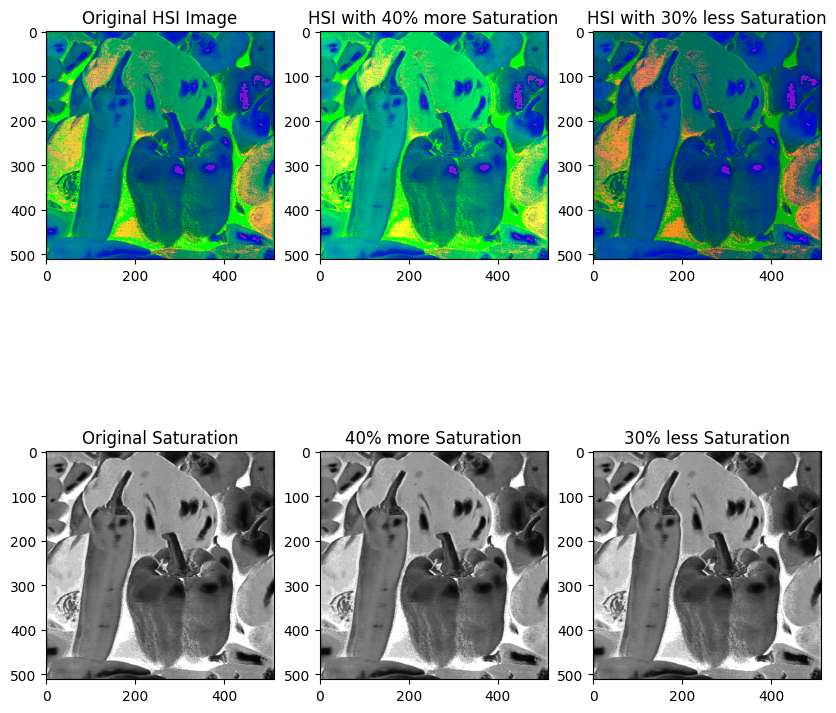

In [ ]:
fig=plt.figure(figsize=(10,10))
#increasing saturation by 40%
s1=saturation*1.4
#decreasing saturation by 30%
s2=saturation*0.7

hsi1=cv2.merge((hue,s1,intensity))
hsi2=cv2.merge((hue,s2,intensity))

fig.add_subplot(231)
plt.imshow(np.clip(hsi,0,1))
plt.title("Original HSI Image")

fig.add_subplot(232)
plt.imshow(np.clip(hsi1, 0, 1))
plt.title("HSI with 40% more Saturation")

fig.add_subplot(233)
plt.imshow(np.clip(hsi2, 0, 1))
plt.title("HSI with 30% less Saturation")

fig.add_subplot(234)
plt.imshow(saturation,cmap='gray')
plt.title("Original Saturation")

fig.add_subplot(235)
plt.imshow(s1,cmap='gray')
plt.title("40% more Saturation")

fig.add_subplot(236)
plt.imshow(s2,cmap='gray')
plt.title("30% less Saturation")


Text(0.5, 1.0, 'Original HSI Image')

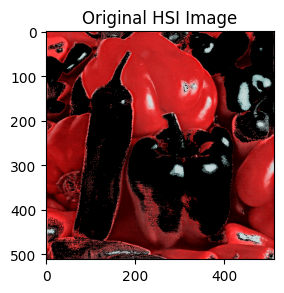

In [ ]:
#converting HSI back to RGB

#calcuate the radians of hue
huer=hue * 2 *np.pi
#initialize R,G,B channels
r,g,b=np.zeros_like(huer),np.zeros_like(huer),np.zeros_like(huer)

#hue component is divided into 3 sectors, dominated by Red Hues, Green Hues and Blue Hues respectively
#id1,2,3 identifies the pixels where the Hue is between those angles

#sector 1 if Hue is between 0-120 degrees

id1=(huer < 2/3 *np.pi)
b[id1]=intensity[id1] * (1-saturation[id1])
r[id1]=intensity[id1] * (1+saturation[id1]* np.cos(huer[id1]) / np.cos(np.pi/3 - huer[id1]))
g[id1]=3*intensity[id1] - (r[id1] + b[id1])

#sector 2 if Hue is between 120-240 degrees

id2= (huer >= 2/3 *np.pi) & (huer < 4/3 *np.pi)
h2=huer[id2] - 2/3 * np.pi
r[id2]=intensity[id2] * (1-saturation[id2])
g[id2]=intensity[id2] * (1+saturation[id2]* np.cos(h2) / np.cos(np.pi/3 - h2))
b[id2]=3*intensity[id2] - (r[id2] + g[id2])

#sector 3 if Hue is between 240-360 degrees
id3= (huer >= 4/3 *np.pi)
h3=huer[id3] - 4/3 * np.pi
g[id3]=intensity[id3] * (1-saturation[id3])
b[id3]=intensity[id3] * (1+saturation[id3] * np.cos(h3) / np.cos(np.pi/3 - h3))
r[id3]=3*intensity[id3] - (g[id3] + b[id3])

rgb_image=cv2.merge((r,g,b))
rgb_image=np.clip(rgb_image * 255, 0, 255).astype(np.uint8)

fig=plt.figure(figsize=(10,10))

fig.add_subplot(231)
plt.imshow(rgb_image)
plt.title("Original HSI Image")

# Image Comparison using Color Histogram

Text(0.5, 1.0, 'Image 2')

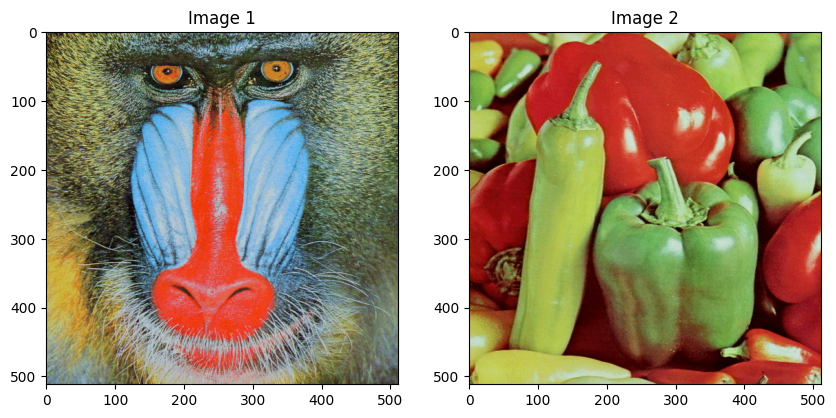

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/mandril_color.tif')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)

image2=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/peppers_color.tif')
image2=cv2.cvtColor(image2,cv2.COLOR_BGR2RGB)

fig=plt.figure(figsize=(10,10))
fig.add_subplot(121)
plt.imshow(image1)
plt.title("Image 1")

fig.add_subplot(122)
plt.imshow(image2)
plt.title("Image 2")

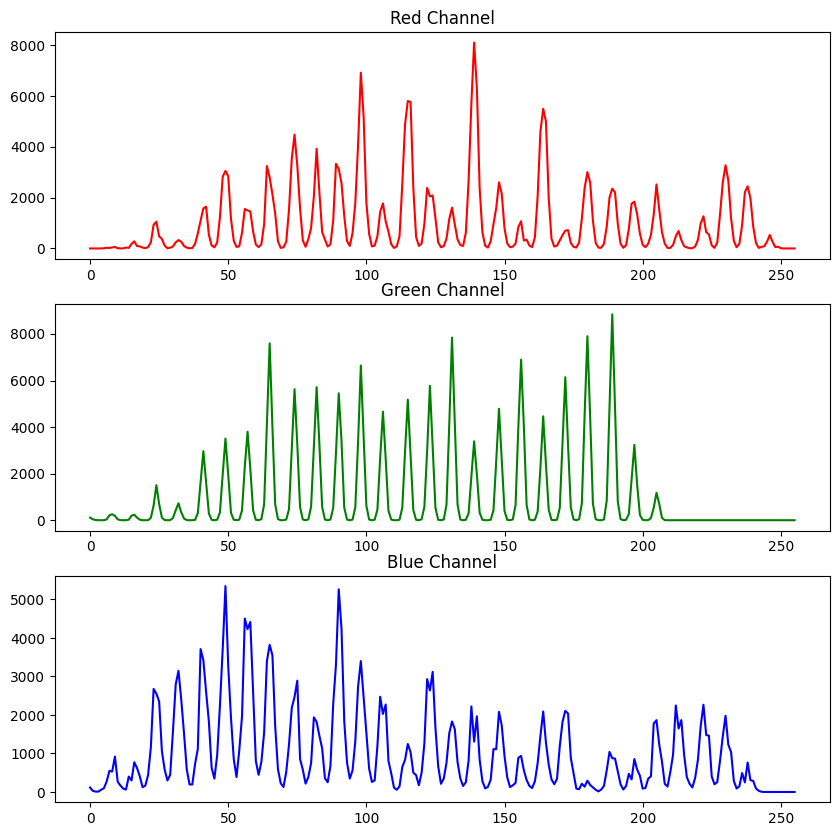

In [ ]:
#plotting the separate color histograms
#for image1
fig=plt.figure(figsize=(10,10))

#format: image, color channel, mask, bin size(256=8 bit values),range
red1=cv2.calcHist([image1],[0],None,[256],[0,256])
green1=cv2.calcHist([image1],[1],None,[256],[0,256])
blue1=cv2.calcHist([image1],[2],None,[256],[0,256])

plt.subplot(311)
plt.title("Red Channel")
plt.plot(red1,color='r')

plt.subplot(312)
plt.title("Green Channel")
plt.plot(green1,color='g')

plt.subplot(313)
plt.title("Blue Channel")
plt.plot(blue1,color='b')

Text(0.5, 1.0, 'Image 1 Color Histogram')

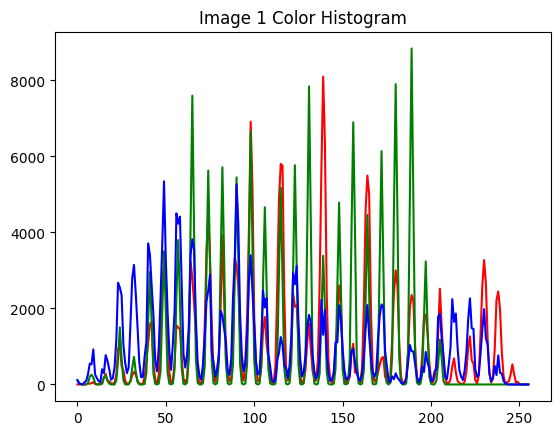

In [ ]:
plt.plot(red1,color='r')
plt.plot(green1,color='g')
plt.plot(blue1,color='b')
plt.title("Image 1 Color Histogram")

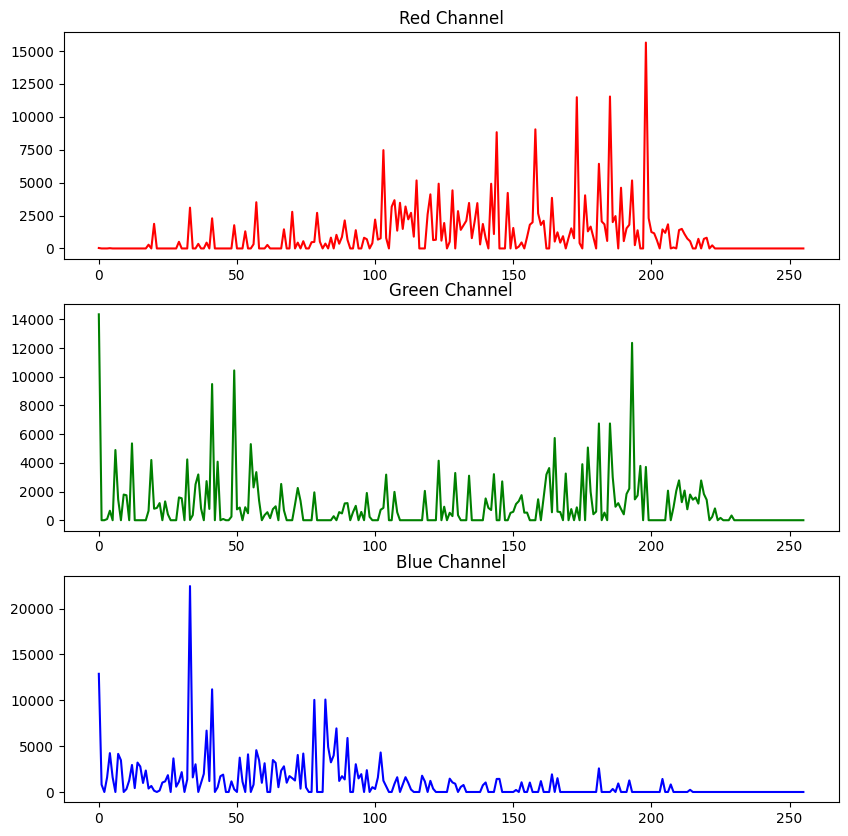

In [ ]:
#for image2
fig=plt.figure(figsize=(10,10))

#format: image, color channel, mask, bin size(256=8 bit values),range
red2=cv2.calcHist([image2],[0],None,[256],[0,256])
green2=cv2.calcHist([image2],[1],None,[256],[0,256])
blue2=cv2.calcHist([image2],[2],None,[256],[0,256])

plt.subplot(311)
plt.title("Red Channel")
plt.plot(red2,color='r')

plt.subplot(312)
plt.title("Green Channel")
plt.plot(green2,color='g')

plt.subplot(313)
plt.title("Blue Channel")
plt.plot(blue2,color='b')

Text(0.5, 1.0, 'Image 2 Color Histogram')

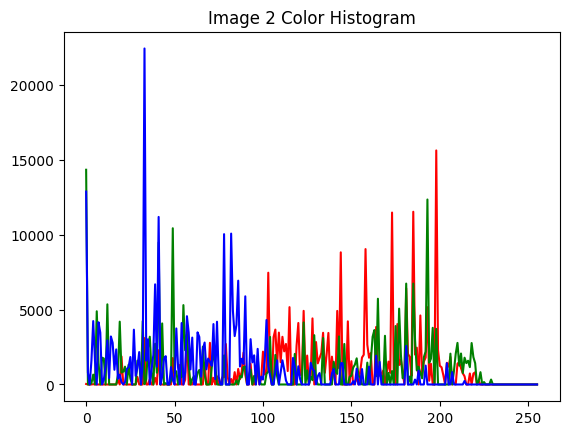

In [ ]:
plt.plot(red2,color='r')
plt.plot(green2,color='g')
plt.plot(blue2,color='b')
plt.title("Image 2 Color Histogram")

In [ ]:
#comparing the 2 histograms using correlation, chi-square and intersection

#for correlation
#correlation= (summation of intensities of(H1(I)-H1mean)*(H2(I)-H2mean) / sqrt(square of the product of the summation of each of the 2 from the numerator))
#values closer to 1 are similar

corr_blue=cv2.compareHist(blue1,blue2,cv2.HISTCMP_CORREL)
corr_green=cv2.compareHist(green1,green2,cv2.HISTCMP_CORREL)
corr_red=cv2.compareHist(red1,red2,cv2.HISTCMP_CORREL)

print("Correlation for Blue Channel:",corr_blue)
print("Correlation for Green Channel:",corr_green)
print("Correlation for Red Channel:",corr_red)
print("")

#for chi-square
#chi-square=(summation of intensities(H1(I)-H2(I))**2 / H1(I))
#similar histograms have lower values

chi_blue=cv2.compareHist(blue1,blue2,cv2.HISTCMP_CHISQR)
chi_green=cv2.compareHist(green1,green2,cv2.HISTCMP_CHISQR)
chi_red=cv2.compareHist(red1,red2,cv2.HISTCMP_CHISQR)

print("Chi-Square for Blue Channel:",chi_blue)
print("Chi-Square for Green Channel:",chi_green)
print("Chi-Square for Red Channel:",chi_red)
print("")

#for intersection
#intersection=summation of intensities (min(H1(I),H2(I)))
#higher values indicate more overlap between the histograms
int_blue=cv2.compareHist(blue1,blue2,cv2.HISTCMP_INTERSECT)
int_green=cv2.compareHist(green1,green2,cv2.HISTCMP_INTERSECT)
int_red=cv2.compareHist(red1,red2,cv2.HISTCMP_INTERSECT)

print("Intersection for Blue Channel:",int_blue)
print("Intersection for Green Channel:",int_green)
print("Intersection for Red Channel:",int_red)
print("")

#for bhattacharyya distance
#distance=(sqrt(1-(sum of intensities(H1(I)xH2(I)) / (sqrt(H1 * H2* N**2)) )))
#values closer to 0 means that the histograms are more similar
bhat_blue=cv2.compareHist(blue1,blue2,cv2.HISTCMP_BHATTACHARYYA)
bhat_green=cv2.compareHist(green1,green2,cv2.HISTCMP_BHATTACHARYYA)
bhat_red=cv2.compareHist(red1,red2,cv2.HISTCMP_BHATTACHARYYA)

print("Bhattacharyya Distance for Blue Channel:",bhat_blue)
print("Bhattacharyya Distance for Green Channel:",bhat_green)
print("Bhattacharyya Distance for Red Channel:",bhat_red)
print("")

#total values of the three
total_corr=(corr_blue+corr_green+corr_red)/3
total_chi=(chi_blue+chi_green+chi_red)/3
total_int=(int_blue+int_green+int_red)/3
total_bhat=(bhat_blue+bhat_green+bhat_red)/3

print("Total Correlation between the 2 Images:",total_corr)
print("Total Chi-Square between the 2 Images:",total_chi)
print("Total Intersection between the 2 Images:",total_int)
print("Total Bhattacharyya Distance between the 2 Images:",total_bhat)

Correlation for Blue Channel: 0.16789796623281789
Correlation for Green Channel: 0.019370924140348546
Correlation for Red Channel: 0.0352669080314742

Chi-Square for Blue Channel: 3598490.4675260214
Chi-Square for Green Channel: 166537909.19583902
Chi-Square for Red Channel: 11197979.403763141

Intersection for Blue Channel: 94602.0
Intersection for Green Channel: 67743.0
Intersection for Red Channel: 85776.0

Bhattacharyya Distance for Blue Channel: 0.6411394063408357
Bhattacharyya Distance for Green Channel: 0.7469591925637074
Bhattacharyya Distance for Red Channel: 0.6753236848204305

Total Correlation between the 2 Images: 0.07417859946821355
Total Chi-Square between the 2 Images: 60444793.02237606
Total Intersection between the 2 Images: 82707.0
Total Bhattacharyya Distance between the 2 Images: 0.6878074279083245


# Image Comparison based on Texture Features

GLCM Texture Value difference with respect to 2 angles and 3 distances

Contrast Difference:
With 0,90 degree with Distance 1: 391.0679236484759 , 793.6314823874795
With 0,90 degree with Distance 3: 714.5121178167822 , 1084.6332691244954
With 0,90 degree with Distance 5: 629.6550018490984 , 990.1749953772119

Dissimilarity Difference:
With 0,90 degree with Distance 1: 9.199467190557627 , 14.7939319349316
With 0,90 degree with Distance 3: 11.998188850687166 , 16.647497390716854
With 0,90 degree with Distance 5: 10.8267612795856 , 15.37280417899404

Homogeneity Difference:
With 0,90 degree with Distance 1: -0.07630298582692191 , -0.12557369946271388
With 0,90 degree with Distance 3: -0.05467392455097342 , -0.0946443501731615
With 0,90 degree with Distance 5: -0.04709854281213313 , -0.07528843292197891

Energy Difference:
With 0,90 degree with Distance 1: -0.004892459321135101 , -0.004892459321135101
With 0,90 degree with Distance 3: -0.0015289514162878 , -0.003746614915203462
With 0,90 d

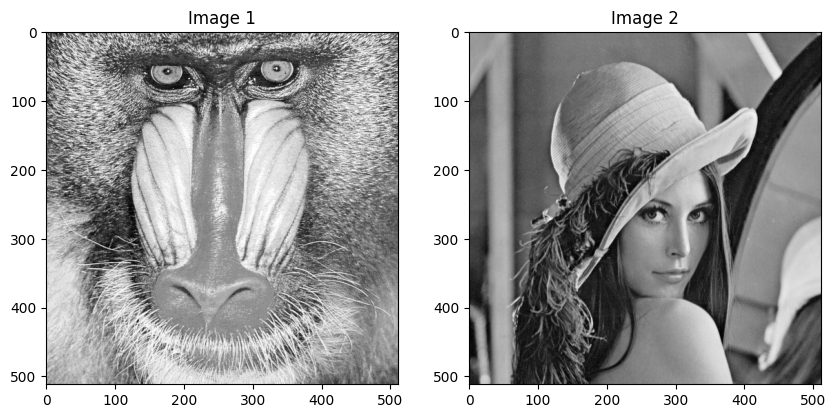

In [ ]:
#Using GLCM texture features
import cv2
import numpy as np
from matplotlib import pyplot as plt
from skimage.feature import graycomatrix, graycoprops

image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/mandril_color.tif')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)

image2=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/lena_color_512.tif')
image2=cv2.cvtColor(image2,cv2.COLOR_BGR2GRAY)


fig=plt.figure(figsize=(10,10))
fig.add_subplot(121)
plt.imshow(image1,cmap="gray")
plt.title("Image 1")

fig.add_subplot(122)
plt.imshow(image2,cmap="gray")
plt.title("Image 2")

#finding the GLCM values for 2 distances and 2 angles
distance=[1,3,5]
angles=[0, np.pi/2]

glcm1=graycomatrix(image1,distance,angles,256,[0,256])
glcm2=graycomatrix(image2,distance,angles,256,[0,256])

#difference in GLCM values:
contrast=graycoprops(glcm1, 'contrast') - graycoprops(glcm2, 'contrast')
dissimilarity=graycoprops(glcm1, 'dissimilarity') - graycoprops(glcm2, 'dissimilarity')
homogeneity=graycoprops(glcm1, 'homogeneity') - graycoprops(glcm2, 'homogeneity')
energy=graycoprops(glcm1, 'energy') - graycoprops(glcm2, 'energy')
correlation=graycoprops(glcm1, 'correlation') - graycoprops(glcm2, 'correlation')
#print(graycoprops(glcm1, 'contrast'),",",graycoprops(glcm2, 'contrast'))
print("GLCM Texture Value difference with respect to 2 angles and 3 distances")
print("")

print("Contrast Difference:")
print("With 0,90 degree with Distance 1:",contrast[0][0],",",contrast[0][1])
print("With 0,90 degree with Distance 3:",contrast[1][0],",",contrast[1][1])
print("With 0,90 degree with Distance 5:",contrast[2][0],",",contrast[2][1])
print("")

print("Dissimilarity Difference:")
print("With 0,90 degree with Distance 1:",dissimilarity[0][0],",",dissimilarity[0][1])
print("With 0,90 degree with Distance 3:",dissimilarity[1][0],",",dissimilarity[1][1])
print("With 0,90 degree with Distance 5:",dissimilarity[2][0],",",dissimilarity[2][1])
print("")

print("Homogeneity Difference:")
print("With 0,90 degree with Distance 1:",homogeneity[0][0],",",homogeneity[0][1])
print("With 0,90 degree with Distance 3:",homogeneity[1][0],",",homogeneity[1][1])
print("With 0,90 degree with Distance 5:",homogeneity[2][0],",",homogeneity[2][1])
print("")

print("Energy Difference:")
print("With 0,90 degree with Distance 1:",energy[0][1],",",energy[0][1])
print("With 0,90 degree with Distance 3:",energy[1][0],",",energy[1][1])
print("With 0,90 degree with Distance 5:",energy[2][0],",",energy[2][1])
print("")

print("Correlation Difference:")
print("With 0,90 degree with Distance 1:",correlation[0][0],",",correlation[0][1])
print("With 0,90 degree with Distance 3:",correlation[1][0],",",correlation[1][1])
print("With 0,90 degree with Distance 5:",correlation[2][0],",",correlation[2][1])
print("")

In [ ]:
def salt_and_pepper_noise(image, percentage):
  size=image.size
  #setting the noise size, with percentage * size
  noise_size=int(percentage * size)
  #selecting indices for adding noise
  random_indices=np.random.choice(size,noise_size)
  noisy_image=image.copy()
  noise=np.random.choice([image.min(),image.max()], noise_size)
  noisy_image.flat[random_indices]=noise
  return noisy_image

noisy_image1=salt_and_pepper_noise(image1,0.3)

cv2.imwrite("/content/drive/MyDrive/Colab Notebooks/Standard Images/mandril_color_noisy.tif",noisy_image1)

True

# Finding the features of an Image using SIFT Transform

Total Number of SIFT Features in the Input Image: 1964


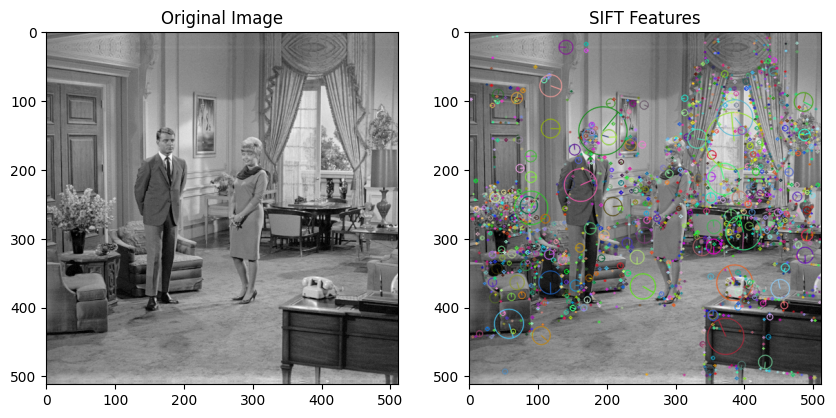

In [ ]:
import cv2
from matplotlib import pyplot as plt

fig=plt.figure(figsize=(10,10))

image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/livingroom.tif')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2GRAY)

#creating the sift object and finding the keypoints
sift=cv2.SIFT_create()
keypoints=sift.detect(image1,None)

#drawing the keypoints
#None to mark the keypoints on image2
#flag to determine how the keypoint is visualized
#cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS shows the scale and orientation of each keypoint
image2=cv2.drawKeypoints(image1,keypoints,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig.add_subplot(121)
plt.imshow(image1,cmap='gray')
plt.title("Original Image")

fig.add_subplot(122)
plt.imshow(image2,cmap='gray')
plt.title("SIFT Features")

print("Total Number of SIFT Features in the Input Image:",len(keypoints))

Total Number of SIFT Features in the Input Image 1: 1670
Total Number of SIFT Features in the Input Image 2: 1460


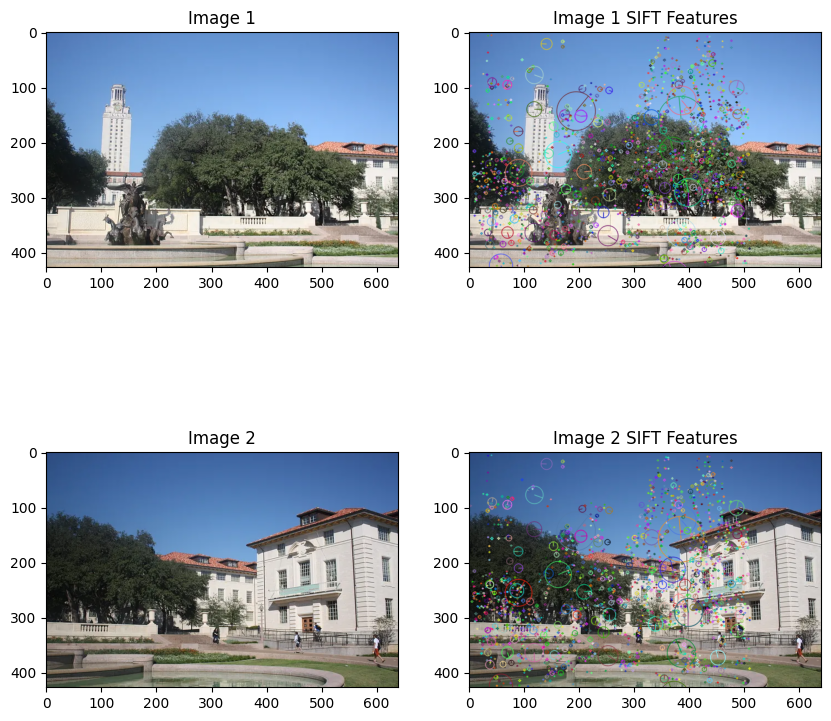

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

fig=plt.figure(figsize=(10,10))

image1=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/pan21.webp')
image1=cv2.cvtColor(image1,cv2.COLOR_BGR2RGB)

image2=cv2.imread('/content/drive/MyDrive/Colab Notebooks/Standard Images/pan22.webp')
image2=cv2.cvtColor(image2,cv2.COLOR_BGR2RGB)

#creating the sift object and finding the keypoints
sift=cv2.SIFT_create()
keypoints1,descriptors1=sift.detectAndCompute(image1,None)
keypoints2,descriptors2=sift.detectAndCompute(image2,None)

#drawing the keypoints
#None to mark the keypoints on image2
#flag to determine how the keypoint is visualized
#cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS shows the scale and orientation of each keypoint
image1_2=cv2.drawKeypoints(image1,keypoints,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
image2_2=cv2.drawKeypoints(image2,keypoints,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

fig.add_subplot(221)
plt.imshow(image1)
plt.title("Image 1")

fig.add_subplot(222)
plt.imshow(image1_2)
plt.title("Image 1 SIFT Features")

fig.add_subplot(223)
plt.imshow(image2)
plt.title("Image 2")

fig.add_subplot(224)
plt.imshow(image2_2)
plt.title("Image 2 SIFT Features")

print("Total Number of SIFT Features in the Input Image 1:",len(keypoints1))
print("Total Number of SIFT Features in the Input Image 2:",len(keypoints2))

In [ ]:
#match the 2 images
#the good matches are described in a homography matrix
#homography matrix describes the transformations between 2 images taken in different viewpoints
#a 3x3 matrix, describes the transformations from one plane to another

def matcher(keypoints1,keypoints2,descriptors1,descriptors2,image1,image2):
  #BFMatcher is Brute Force Matcher which maps one descriptor to the other descriptors and finds the best matches
  bf=cv2.BFMatcher()
  matches=bf.knnMatch(descriptors1,descriptors2,k=2)#will give the closest 2 matches for each descriptor

  #giving a threshold value of 0.5 for calculating the best matches
  good=[]
  #a distance ratio test is performed here
  #a match if considered if the distance is less than 50% of the distance from j
  for i,j in matches:
    if i.distance < 0.5*j.distance:
      good.append([i])

  #using values from good[], the homography matrix is formed
  src_pts = np.float32([keypoints1[m[0].queryIdx].pt for m in good]).reshape(-1, 1, 2)
  dst_pts = np.float32([keypoints2[m[0].trainIdx].pt for m in good]).reshape(-1, 1, 2)

  H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

  #to get the coordinates(pt) of each keypoints and then appends it to matches
  matches=[]
  for pair in good:
    matches.append(list(keypoints1[pair[0].queryIdx].pt +keypoints2[pair[0].trainIdx].pt))

  matches=np.array(matches)
  return matches,H

matches,H=matcher(keypoints1,keypoints2,descriptors1,descriptors2,image1,image2)
#print(matches)
print(H)

[[ 1.30236343e+00 -7.32412258e-02 -3.60088738e+02]
 [ 1.71430447e-01  1.22415290e+00 -1.06232708e+02]
 [ 4.51732725e-04  3.80503415e-05  1.00000000e+00]]


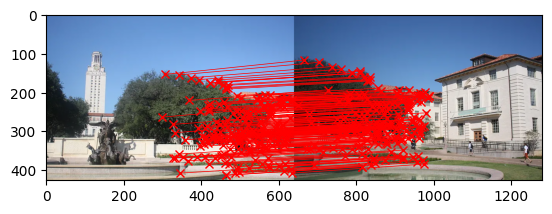

In [ ]:
#plotting the matches

images=np.concatenate((image1,image2),axis=1)
match_image=images.copy()

offset=images.shape[1]/2
fig,ax=plt.subplots()
ax.imshow(np.array(match_image).astype('uint8'))
ax.plot(matches[:,0],matches[:,1],'xr')
ax.plot(matches[:,2] + offset, matches[:,3],'xr')
ax.plot([matches[:,0], matches[:,2] + offset], [matches[:, 1],matches[:, 3]], 'r', linewidth=0.5)
plt.show()

In [ ]:
print(len(matches))

192


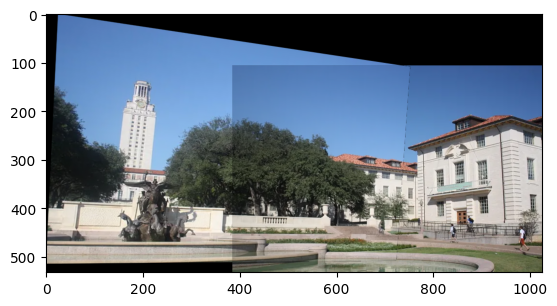

In [ ]:
#stitching the 2 images

#converting the images to double and normalizing it
image1=cv2.normalize(image1.astype('float'),None,0.0,1.0,cv2.NORM_MINMAX)
image2=cv2.normalize(image2.astype('float'),None,0.0,1.0,cv2.NORM_MINMAX)

#considering the first image
height1,width1,channel1=image1.shape
corners=[[0,0,1],[width1,0,1],[width1,height1,1],[0,height1,1]]#for homography matrix
corners_new=[np.dot(H, corner) for corner in corners]#applying H to each corner point to get the transformed points
corners_new=np.array(corners_new).T

#normalization of transformed corners
x_news=corners_new[0] / corners_new[2]
y_news = corners_new[1] / corners_new[2]
#calculating the minimum coordinates for translation
y_min = min(y_news)
x_min = min(x_news)

#translation matrix
translation_matrix=np.array([[1,0,-x_min],[0,1,-y_min],[0,0,1]])
H=np.dot(translation_matrix,H)

#getting the new height and width
height_new=int(round(abs(y_min)+height1))
width_new=int(round(abs(x_min)+width1))
size=(width_new,height_new)

#taking the first image and warping with H
#cv2.warpPerspective applies a perspective transformation to an image
warped1=cv2.warpPerspective(image1,H,size)

height2,width2,channel2=image2.shape

height_new=int(round(abs(y_min)+height2))
width_new=int(round(abs(x_min)+width2))
size=(width_new,height_new)

#taking the second image and warping with translation matrix
warped2=cv2.warpPerspective(image2,translation_matrix,size)

#for black pixel
black=np.zeros(3)

#stitching and storing in warped1
for i in range(warped2.shape[0]):
  for j in range(warped2.shape[1]):
    pixel1=warped1[i ,j , :]#pixel from warped1 is taken
    pixel2=warped2[i,j,:]#pixel from warped2 is taken

    #if warped1 is non balck and warped2 is black, pixel1 is still used for warped1
    if not np.array_equal(pixel1,black) and np.array_equal(pixel2,black):
      warped1[i,j,:]=pixel1
    #considering pixel2 if warped1 pixel is black and warped2 pixel is valid
    elif np.array_equal(pixel1,black) and not np.array_equal(pixel2,black):
      warped1[i,j,:]=pixel2
    #if both the values are valid, an average of both the pixels are considered
    elif not np.array_equal(pixel1,black) and not np.array_equal(pixel2,black):
      warped1[i,j,:]=(pixel1+pixel2)/2

stitched_image=warped1[:warped2.shape[0], :warped2.shape[1], :]

plt.imshow(stitched_image)

# Count the number of objects in an Image
##### (taking a cell image to calculate the number of cells)